In [1]:
import json
import os
from urllib.request import urlopen
import plotly.express as px
import pandas as pd

In [3]:
# MAKE SURE TO CHANGE FILEPATHS TO THE ONES IN YOUR MACHINE SO THIS CODE RUNS!!!
# I.E. C:/JONNYS/BIOJAZZDIGITALMCHINE/KOF.data --> C:/MYOWNLOVEMACHINE/KOF.data

# load ventas sample subset
ventas = pd.read_csv('data/M1.7/canal_muestra17.csv.gz')[['KUNNR','CATEGORIA','INGRESOBRUTO']]

# load clients data (which contains info about the location of the sale
clientes = pd.read_csv('data/todas/clientes.csv.gz')[['ZZCRMA_LONG','ZZCRMA_LAT','CITY1','KUNNR','POST_CODE1']]

# merge data frames
df = ventas.merge(clientes,on='KUNNR')

# change the name and type of postcode on ventas so it matches those in geojsons
df=df.rename(columns={'POST_CODE1':'d_cp'})
df['d_cp'] = df['d_cp'].astype(int)

In [19]:
# combine all data from all postal zones into one big fat list

all_states = []

for geojson in os.listdir('./geojson/CP/'):
    if geojson.endswith("json"):
        with open(f"./geojson/CP/{geojson}") as j:
            all_states.extend(json.load(j)['features'])

# read AGS json to have the structure of the geojson            
with open("./geojson/CP/01_Ags_CP.json") as j:
            munimex = json.load(j)

# replace AGS postal zones with the big fat list to have one single big fat geojson for all Mexico
munimex['features'] = all_states

# add a postal code as id to each feature, so we have postal code as 'id' and it's coordinates in 'geography' -- this is how the data in plotly needs to be formatted
## OMG! How does he know thta?! --> https://plotly.com/python/mapbox-county-choropleth/
for i in range(len(munimex['features'])):
    munimex['features'][i]['id'] = munimex['features'][i]['properties']['d_cp']
    
# keep only postal codes for which we have data from KOF
filtered_states = []
for i in range(len(munimex['features'])):
    if int(munimex['features'][i]['id']) in set(mapa.d_cp):
        filtered_states.append(munimex['features'][i])

# filtered postal codes -- n=295
munimex['features'] = filtered_states

# make sales/clients data into unique observations per postal code averaging ingresobruto
mapa = df.groupby('d_cp')['INGRESOBRUTO'].agg('mean').reset_index()

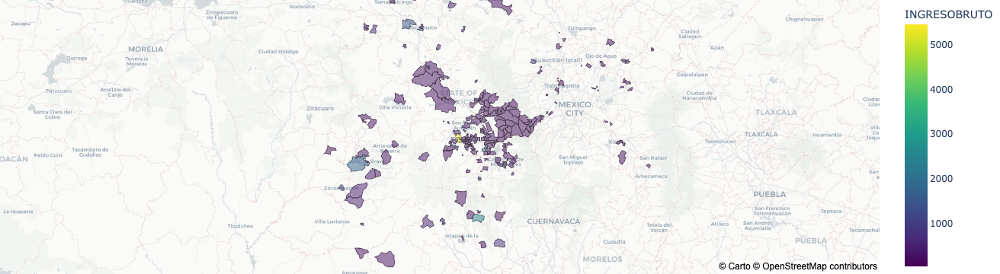

In [27]:
# draw a map using INGRESOBRUTO as the criterion for colour -- yellow is most profitable postal code for KOF

fig = px.choropleth_mapbox(mapa, 
                           geojson=munimex, 
                           locations='d_cp', 
                           color='INGRESOBRUTO',
                           color_continuous_scale="Viridis",
                           range_color=(min(mapa.INGRESOBRUTO), max(mapa.INGRESOBRUTO)),
                           mapbox_style = "carto-positron",
                           center = {"lat": 19.432608, 
                                     "lon": -99.133209},
                           zoom=9, 
                           opacity = 0.5                          
                          )

fig.update_layout(margin={"r":0,
                          "t":0,
                          "l":0,
                          "b":0})

fig.show()

In [ ]:
## write your own code to visualise most profitable postal codes by product category or sales channel
## run with all of the data or at least the big samples to get more representative results